# Find the optimum Rotation of CTIO Data in May 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne et Jérémy Neveu
- affiliation : LAL/IN2P3/CNRS, France
- date   : May 29th 2017
- update : June 4th 2017


- The goal is to rotate the image correctly such the dispersive axis must be parallel to X.
Carefull check must be done with eye such the fit of the Y vs X line is correct without bias.
This can be done on every image. Another solution is to force the value of the rotation angle
if one is sure of it.
- So One must decide if he want one average rotation angle or one rotation angle for each image.
Not sure.
- An Hessian method used to detect filaments in maps has been adapted to detect the spectra and 
compute their rotation angles

In [2]:
#%%javascript
#var kernel = IPython.notebook.kernel;
#var thename = window.document.getElementById("notebook_name").innerHTML;
#var command = "theNotebook = " + "'"+thename+"'";
#kernel.execute(command);

In [3]:
#print theNotebook

In [1]:
theNotebook="FindOptRot"

In [2]:
%matplotlib inline
%matplotlib inline
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
import numpy as np
import math as m

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os, sys
sys.path.append('../../common_tools')
from scan_holo import *

In [3]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [4]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal
from matplotlib import cm

In [5]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.2.0


In [6]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [7]:
%load_ext Cython

In [8]:
from IPython.display import Image, display

In [9]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [10]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 15),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [11]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

### Output directory for images generated in the notebook view (not true fits images)

In [12]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images

In [13]:
ensure_dir(dir_top_images) # create that directory

### input directory of fits images

In [14]:
inputdir="cut_fitsimages"
MIN_IMGNUMBER=144
MAX_IMGNUMBER=357
object_name='HD205905 Jun 08th 2017'
SelectTagRe='^cutimg_20170608_([0-9]+).fits$' # regular expression to select the file
SearchTagRe='^cutimg_20170608_[0-9]+.fits$'
NBIMGPERROW=4
BigFigSize=(20,20)

### output directory of fits images

In [15]:
outputdir="./rotated_fitsimages"

In [16]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [17]:
input_filelist=os.listdir(inputdir) 

In [18]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [19]:
print input_filelist

['cutimg_20170608_155.fits' 'cutimg_20170608_159.fits'
 'cutimg_20170608_160.fits' 'cutimg_20170608_161.fits'
 'cutimg_20170608_162.fits' 'cutimg_20170608_165.fits'
 'cutimg_20170608_167.fits' 'cutimg_20170608_173.fits'
 'cutimg_20170608_176.fits' 'cutimg_20170608_183.fits'
 'cutimg_20170608_185.fits' 'cutimg_20170608_189.fits'
 'cutimg_20170608_190.fits' 'cutimg_20170608_193.fits'
 'cutimg_20170608_196.fits' 'cutimg_20170608_197.fits'
 'cutimg_20170608_198.fits' 'cutimg_20170608_209.fits'
 'cutimg_20170608_213.fits' 'cutimg_20170608_215.fits'
 'cutimg_20170608_221.fits' 'cutimg_20170608_226.fits'
 'cutimg_20170608_231.fits' 'cutimg_20170608_242.fits'
 'cutimg_20170608_244.fits' 'cutimg_20170608_246.fits'
 'cutimg_20170608_247.fits' 'cutimg_20170608_251.fits'
 'cutimg_20170608_254.fits' 'cutimg_20170608_256.fits'
 'cutimg_20170608_258.fits' 'cutimg_20170608_262.fits'
 'cutimg_20170608_263.fits' 'cutimg_20170608_274.fits'
 'cutimg_20170608_275.fits' 'cutimg_20170608_276.fits'
 'cutimg_2

In [20]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [21]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    

    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                num_str=re.findall(SelectTagRe,file)[0]
                index=int(num_str)
                filelist_fitsimages.append(filename)
                indexes_files.append(index)
    return indexes_files, filelist_fitsimages


In [22]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # Make the list

In [23]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [24]:
print indexes_files

[155 159 160 161 162 165 167 173 176 183 185 189 190 193 196 197 198 209
 213 215 221 226 231 242 244 246 247 251 254 256 258 262 263 274 275 276
 283 286 289 296 297 298 302 318 319 321 322 323 327 336 346 348 357]


In [25]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [26]:
sorted_numbers=indexes_files[sorted_indexes]

In [27]:
print sorted_indexes

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49
 50 51 52]


In [28]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [29]:
#sorted_files

## Build full filename
----------------------------

In [30]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [31]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [32]:
print sorted_filenames.shape

(53,)


## Acces to data of  images
----------------------------------

In [33]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []
all_filt = []

In [34]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_expo = []
    all_filt = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        filters = header['FILTERS']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        all_filt.append(filters)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt

In [35]:
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

## Show images
-----------------------

In [36]:
len(all_images)

53

In [37]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m
global NBIMGPERROW
    
def ShowImages(all_images,all_titles,object_name,dir_top_images):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMGPERROW=4
    NBIMAGES=len(all_images)
    #MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    MAXIMGROW=max(2,int(m.ceil(float(NBIMAGES)/float(NBIMGPERROW))))

    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,3*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        xprofile=np.sum(all_images[index],axis=0)
        x0=np.where(xprofile==xprofile.max())[0][0]
        thex0.append(x0)
        im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',vmin=-10,vmax=800)
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
    title='Images of {}'.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'input_images.pdf')
    plt.savefig(figfilename)  
    return thex0

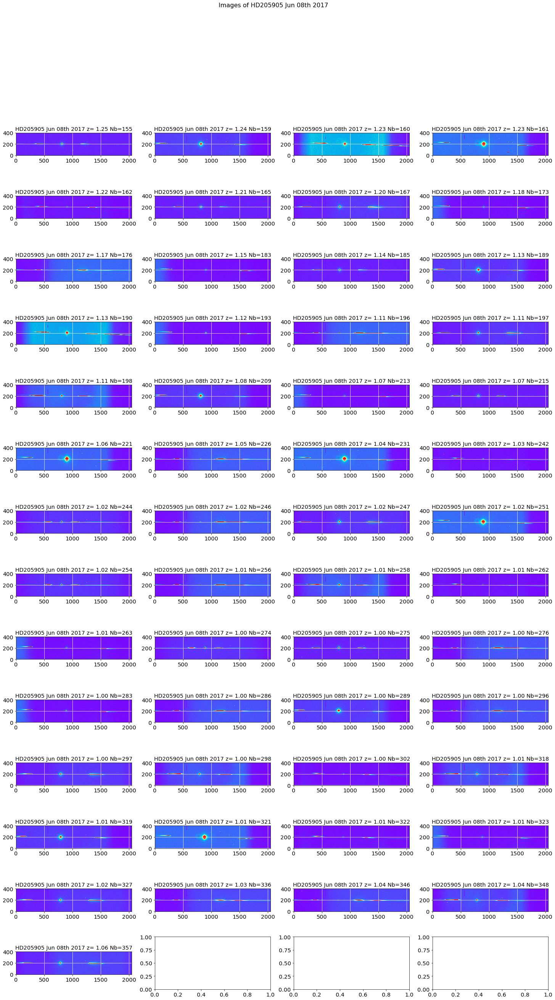

In [38]:
thex0=ShowImages(all_images,all_titles,object_name,dir_top_images)

## Duplicate the images

In [39]:
all_images2=[]
for image in all_images:
    image_copy=np.copy(image)
    all_images2.append(image_copy)

## Subtract Background

In [40]:
for theimage in all_images2:
    NR,NC=theimage.shape
    EmptySkyBackground=np.zeros([NR,NC])
    SkyBackground=EmptySkyBackground+np.median(theimage,axis=0)
    theimage-=SkyBackground

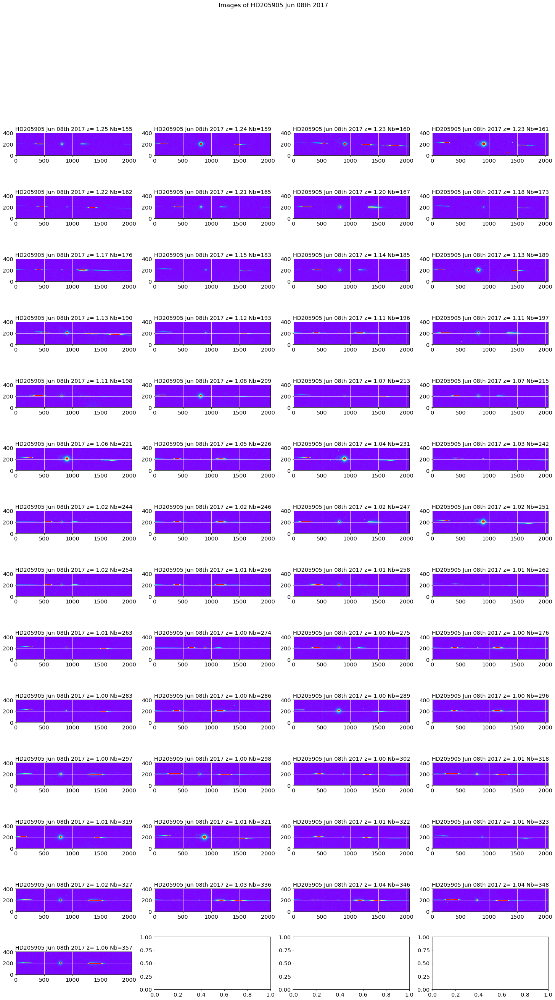

In [41]:
thex02=ShowImages(all_images2,all_titles,object_name,dir_top_images)

### Shows the transverse profile

In [42]:
DeltaX=600
w=20
ws=80

In [43]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import math as m    
import os


def ShowTransverseProfile(all_images,all_titles,object_name,all_expo,dir_top_images):
    """
    ShowTransverseProfile: Show the raw images without background subtraction
    =====================
    """
    NBIMGPERROW=4
    NBIMAGES=len(all_images)
    #MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    MAXIMGROW=max(2,int(m.ceil(float(NBIMAGES)/float(NBIMGPERROW))))
    DeltaX=600
    w=20
    ws=80
    thespectra= []
    they0= []
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        data=np.copy(all_images[index])
        data[:,DeltaX-ws:DeltaX+ws]=0
        if(all_expo[index]<=0):
            yprofile=np.sum(data,axis=1)  #very special case
        else:
            yprofile=np.sum(data,axis=1)/all_expo[index]
        ymin=1
        ymax=yprofile.max()
        y0=np.where(yprofile==ymax)[0][0]
        they0.append(y0)
        #im=axarr[iy,ix].imshow(data,vmin=-10,vmax=50)
        axarr[iy,ix].semilogy(yprofile)
        axarr[iy,ix].semilogy([y0,y0],[ymin,ymax],'r-')
        axarr[iy,ix].semilogy([y0-w,y0-w],[ymin,ymax],'k-')
        axarr[iy,ix].semilogy([y0+w,y0+w],[ymin,ymax],'k-')
        axarr[iy,ix].set_ylim(1000.,2e5)
        spectrum2D=np.copy(data[y0-w:y0+w,:])
        xprofile=np.sum(spectrum2D,axis=0)
        thespectra.append(xprofile/(2.*float(w))/all_expo[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    title='Spectrum tranverse profile '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'transverse_profile.pdf')
    plt.savefig(figfilename)  
    return thespectra,they0

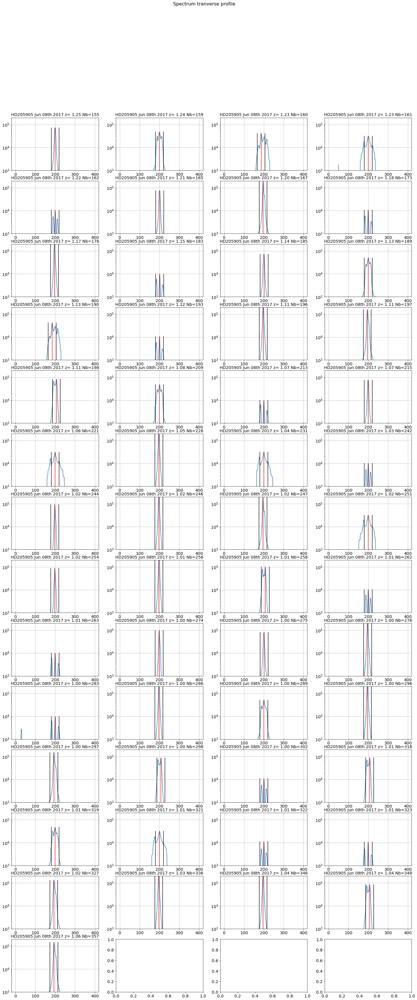

In [44]:
thespectra,they0=ShowTransverseProfile(all_images2,all_titles,object_name,all_expo,dir_top_images)

In [45]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m
def ShowSpectrumProfile(spectra,all_titles,object_name,dir_top_images):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBIMGPERROW=4
    NBSPEC=len(spectra)
    #MAXIMGROW=int(NBSPEC/NBIMGPERROW)+1
    MAXIMGROW=max(2,int(m.ceil(float(NBSPEC)/float(NBIMGPERROW))))
    
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    for index in np.arange(0,NBSPEC):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        axarr[iy,ix].plot(spectra[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,200.)
    title='Spectrum 1D profile '.format(object_name)
    figfilename=os.path.join(dir_top_images,'longitudinal_profile.pdf')
    plt.savefig(figfilename)  
    plt.suptitle(title,size=16)

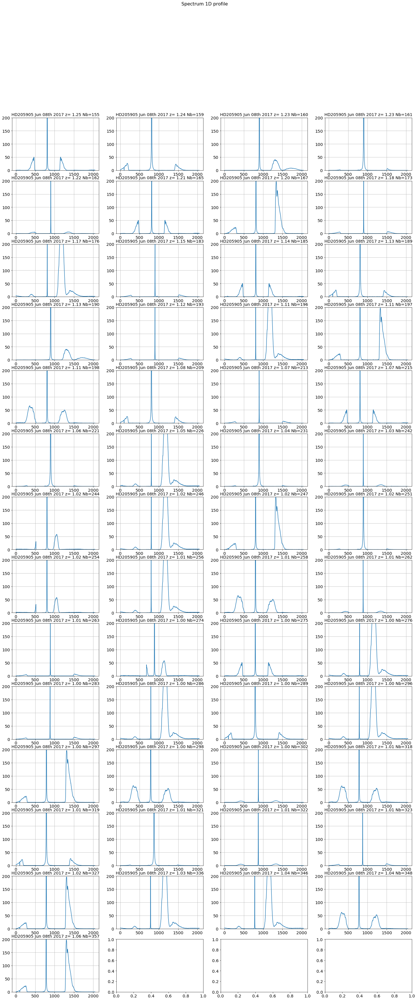

In [46]:
ShowSpectrumProfile(thespectra,all_titles,object_name,dir_top_images)

In [47]:
print they0

[200, 200, 186, 200, 200, 201, 196, 200, 197, 201, 201, 200, 185, 200, 197, 195, 206, 200, 200, 200, 200, 197, 200, 200, 198, 197, 195, 200, 198, 197, 207, 200, 200, 198, 201, 197, 200, 197, 200, 196, 194, 207, 200, 207, 200, 200, 200, 200, 193, 196, 196, 207, 194]


In [48]:
print thex0

[811, 813, 902, 903, 903, 814, 814, 902, 811, 901, 810, 810, 899, 899, 807, 809, 807, 808, 897, 808, 898, 806, 895, 893, 805, 804, 805, 895, 803, 801, 801, 889, 891, 887, 797, 797, 884, 793, 794, 789, 790, 789, 877, 785, 788, 876, 874, 876, 786, 785, 782, 783, 783]


### Test rotation optimum
----------------------------

In [49]:
from scipy import stats 
from scipy import ndimage
from scipy.optimize import curve_fit

In [50]:
sel=0

In [51]:
image_sel=np.copy(all_images2[sel])
y0=they0[sel]
x0=thex0[sel]

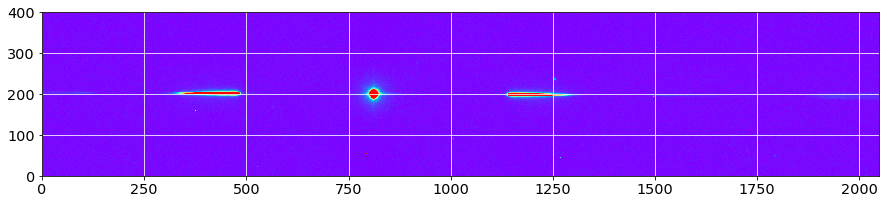

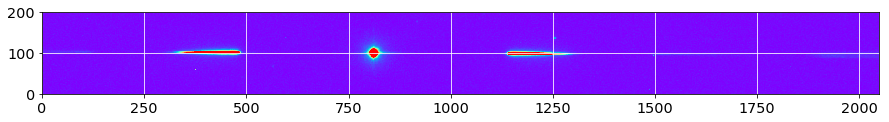

In [52]:
width_cut = 100

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,:])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

### find the orientation by the average

In [53]:
def ComputeMedY(data):
    """
    Compute the median of Y vs X to find later the angle of rotation
    """
    NBINSY=data.shape[0]
    NBINSX=data.shape[1]
    the_medianY=np.zeros(NBINSX)
    the_y=np.zeros(NBINSY)
    for ix in np.arange(NBINSX):
        the_ysum=np.sum(data[:,ix])
        for iy in np.arange(NBINSY):
            the_y[iy]=iy*data[iy,ix]
        if(the_ysum>0):
            med=np.sum(the_y)/the_ysum
            the_medianY[ix]=med
    return the_medianY

In [54]:
def ComputeAveY(data):
    """
    Compute the average of Y vs X to find later the angle of rotation
    """
    NBINSY=data.shape[0]
    NBINSX=data.shape[1]
    the_averY=np.zeros(NBINSX)
    the_y=np.zeros(NBINSY)
    for ix in np.arange(NBINSX):
        the_ysum=np.sum(data[:,ix])
        for iy in np.arange(NBINSY):
            the_y[iy]=iy*data[iy,ix]
        if(the_ysum>0):
            med=np.sum(the_y)/the_ysum
            the_averY[ix]=med
    return the_averY

In [55]:

xindex=np.arange(data.shape[1])

In [56]:
#selected_indexes=np.where(np.logical_or(xindex<480,xindex>1100))

In [57]:
#selected_indexes=np.where(np.logical_or(np.logical_and(xindex>100,xindex<200) ,np.logical_and(xindex>1410,xindex<1600)))

In [58]:
selected_indexes=np.where(np.logical_or(np.logical_and(xindex>0,xindex<200) ,np.logical_and(xindex>750,xindex<1600)))

In [59]:
yaver=ComputeAveY(data)

In [60]:
XtoFit=np.array(xindex[selected_indexes])
YtoFit=np.array(yaver[selected_indexes])

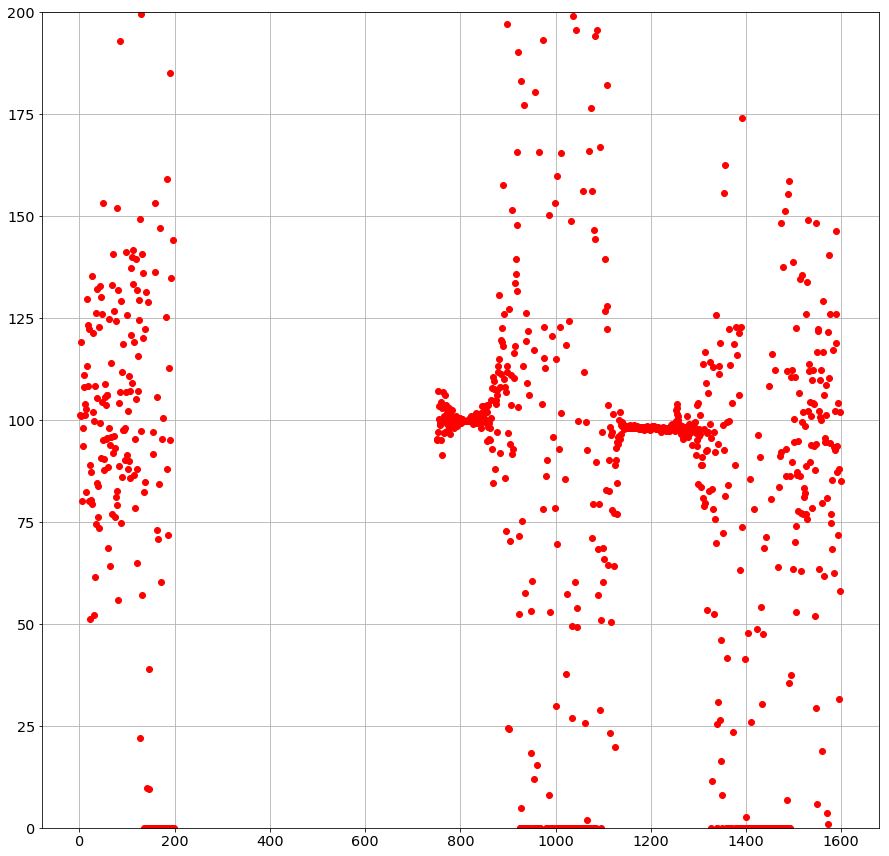

In [61]:
plt.plot(XtoFit,YtoFit,'ro')
plt.ylim(0,200)
plt.grid(True)

In [62]:
selected_indexes2=np.where(np.logical_and(YtoFit<200,YtoFit>0))

In [63]:
XtoFit2=XtoFit[selected_indexes2]
YtoFit2=YtoFit[selected_indexes2]

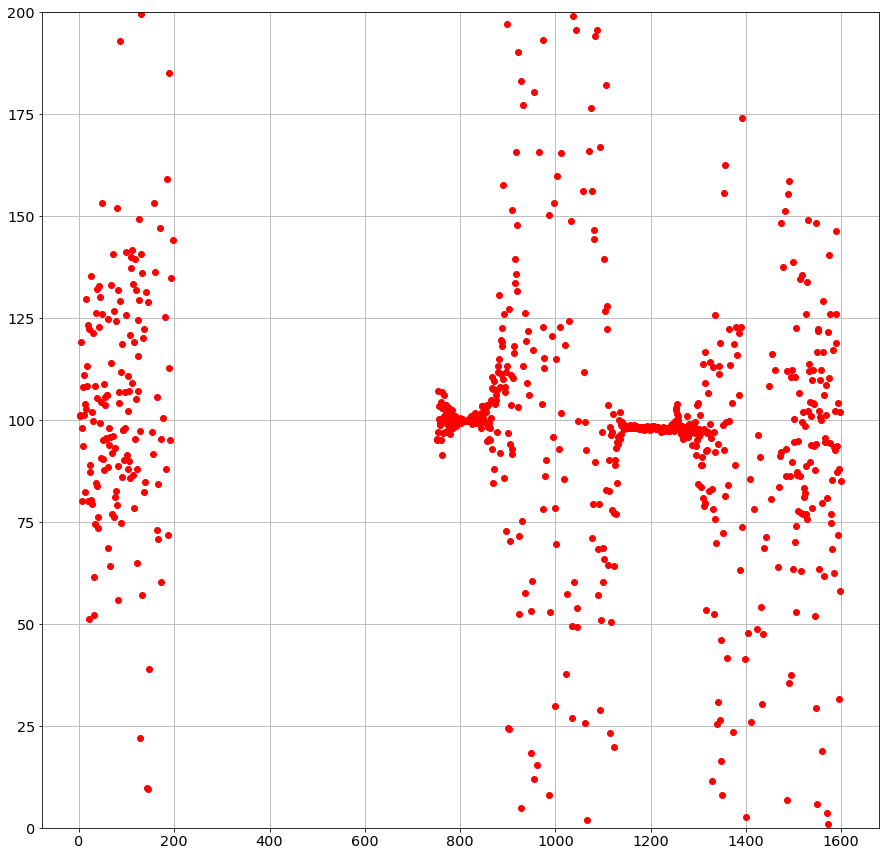

In [64]:
plt.plot(XtoFit2,YtoFit2,'ro')
plt.ylim(0,200)
plt.grid(True)

In [65]:
def fit_func(x, a, b):
    return a*x + b

In [66]:
from scipy.optimize import curve_fit
   

In [67]:
params = curve_fit(fit_func, XtoFit2, YtoFit2)
[a, b] = params[0]

In [68]:
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = fit_func(x_new,a,b)

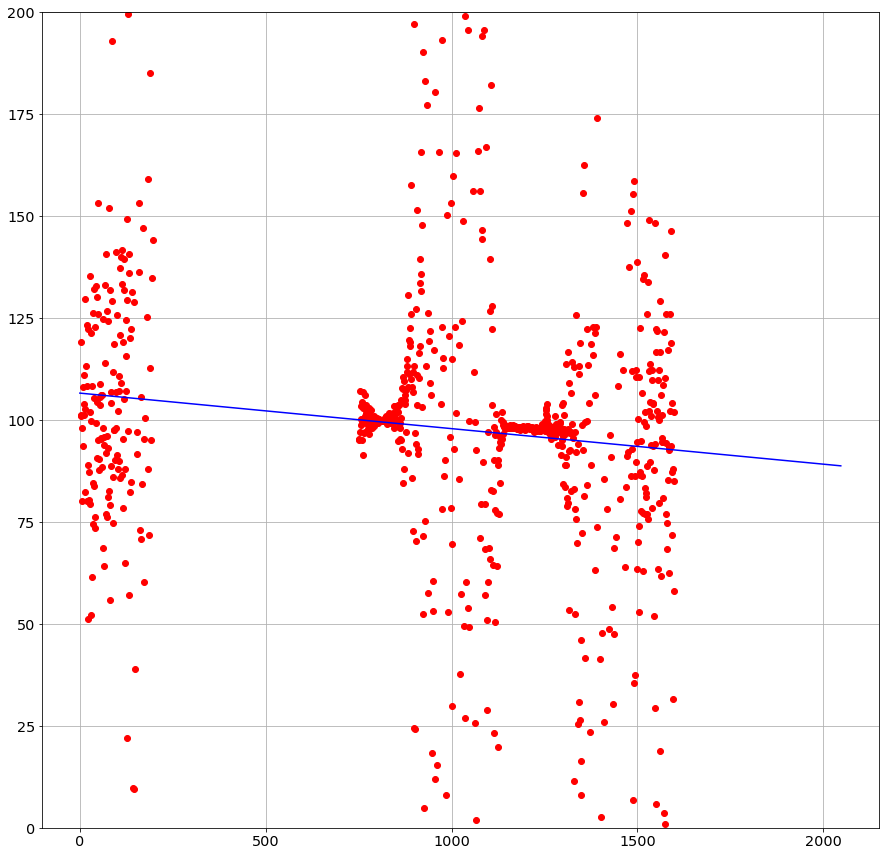

In [69]:
plt.plot(XtoFit2,YtoFit2,'ro')
plt.plot(x_new,y_new,'b-')
plt.ylim(0,200)
plt.grid(True)

In [70]:
print a,b

-0.00871387167651 106.619704405


In [71]:
print np.arctan(a)*180/np.pi

-0.499255434124


### Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

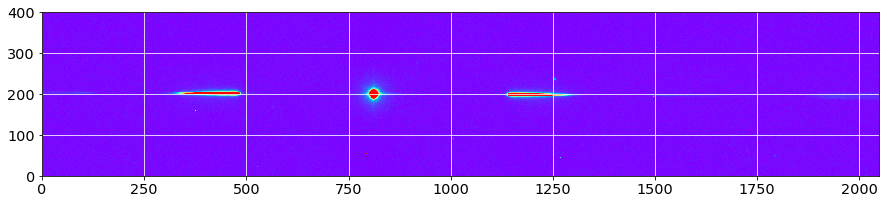

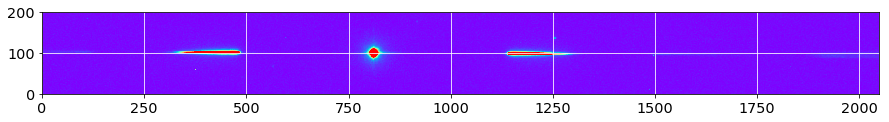

In [72]:
width_cut = 100

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,:])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

In [73]:
from skimage.feature import hessian_matrix
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

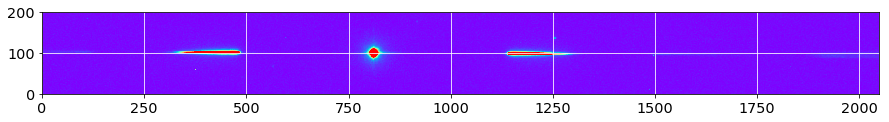

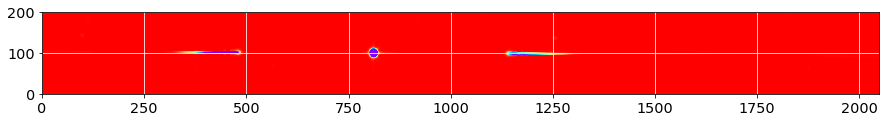

In [74]:
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Maintenant on va sélectionner le spectre à l'aide d'un seuil pour éliminer le fond.

Number of remaining pixels : 2246


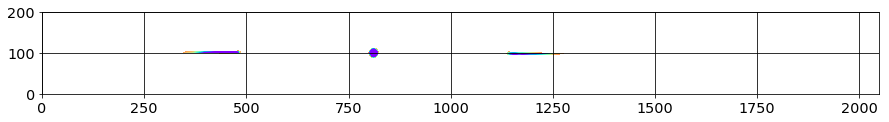

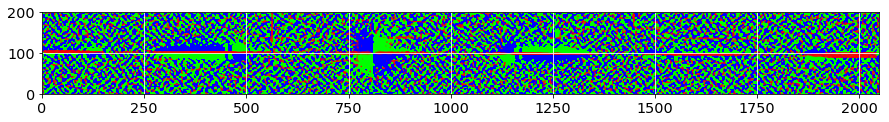

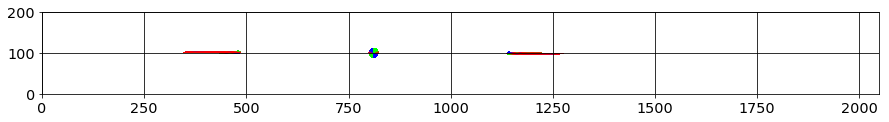

In [75]:
lambda_threshold = -20  

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

On sait que l'angle que l'on recherche est petit car l'axe de dispersion du réseau est bien aligné selon x, donc on peut sélectionner.

Number of remaining pixels : 1466


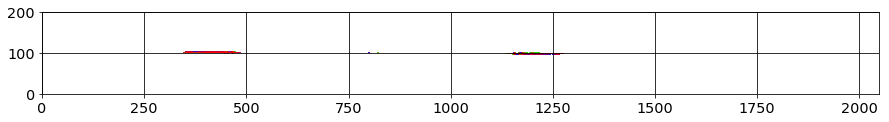

In [76]:
deg_threshold = 8

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : -0.259314021766


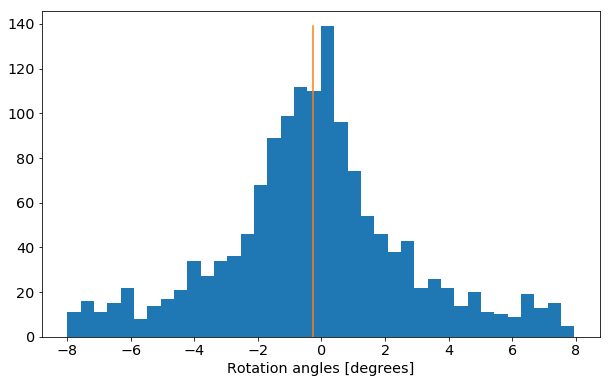

In [77]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

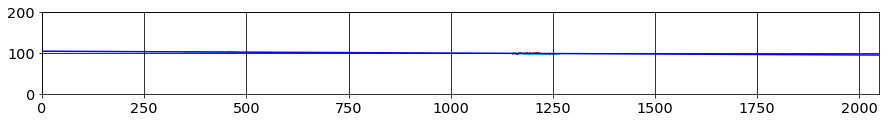

In [78]:
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()

On peut aussi essayer de fitter le spectre qui a été détecté par la méthode ci-dessus.

Rotation angle from fit : -0.243249962808


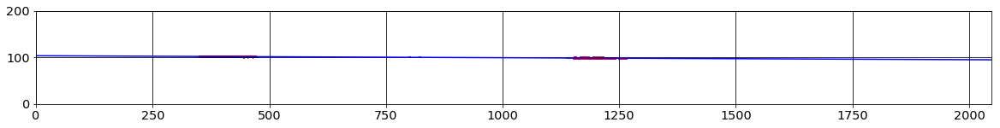

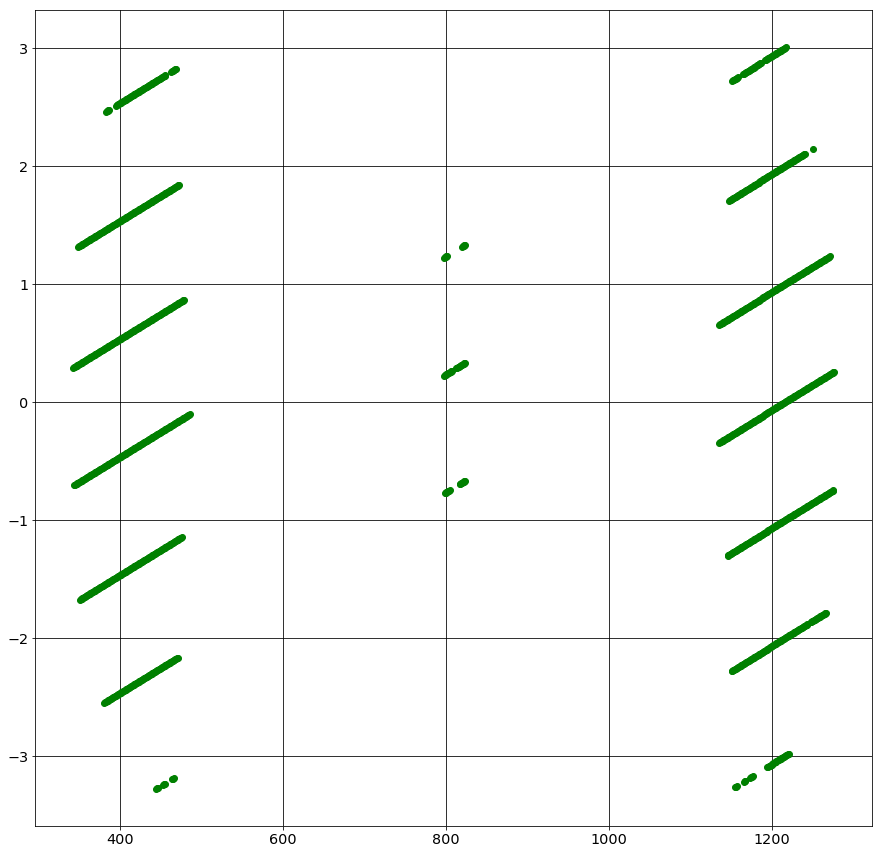

In [79]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>12 : continue
            xtofit.append(ix)
            ytofit.append(iy)
params = curve_fit(fit_func, xtofit, ytofit)
[a, b] = params[0]
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = fit_func(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,30])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-fit_func(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

Je pense que la méthode de fit est plus compliquée dans un champ encombré.

## Find Rotation angle for each image
----------------------------------------------

In [80]:
def ComputeRotationAngle(all_images,thex0,they0,all_titles,object_name):
    """
    ComputeRotationAngle
    ====================
    
    input:
    ------
    all_images
    thex0
    they0
    
    
    output:
    ------
    param_a
    param_b
    
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    
    param_a=np.zeros(NBIMAGES)
    param_b=np.zeros(NBIMAGES)

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        
        image=all_images[index]    
        
        image_sel=np.copy(image)
        y0=they0[index]
        x0=thex0[index]
        
        # extract a region of 200 x 1000 centered at y=100,x=500
        
        region=np.copy(image_sel[y0-100:y0+100,:])
        data=np.copy(region)
        
        xindex=np.arange(data.shape[1])
        
        #selected_indexes=np.where(np.logical_or(np.logical_and(xindex>100,xindex<200) ,np.logical_and(xindex>1410,xindex<1600))) 
        selected_indexes=np.where(np.logical_or(np.logical_and(xindex>0,xindex<150) ,np.logical_and(xindex>1500,xindex<1600)))
        # compute Y vs X
        yaver=ComputeAveY(data)
        
        XtoFit=xindex[selected_indexes]
        YtoFit=yaver[selected_indexes]
        # does the fit
        params = curve_fit(fit_func, XtoFit, YtoFit)
        [a, b] = params[0]
        
        param_a[index]=a
        param_b[index]=b
        
        print index,' y = ',a,' * x + ',b
        x_new = np.linspace(xindex.min(),xindex.max(), 50)
        y_new = fit_func(x_new,a,b)
    
        im=axarr[iy,ix].plot(XtoFit,YtoFit,'ro')
        im=axarr[iy,ix].plot(x_new,y_new,'b-')
        axarr[iy,ix].set_title(all_titles[index])
        
        axarr[iy,ix].set_ylim(0,200)
        axarr[iy,ix].grid(True)
        
    title='Fit rotation angle of '.format(object_name)    
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
    plt.savefig(figfilename)  
    
    
    return param_a,param_b
    
    

0  y =  -0.0090353470448  * x +  103.166018568
1  y =  -0.0183172716852  * x +  113.053624913
2  y =  -0.0631963428434  * x +  169.204195984
3  y =  -0.038989054618  * x +  137.42920155
4  y =  -0.120368715416  * x +  180.039143397
5  y =  -0.00294365764881  * x +  87.7040068768
6  y =  -0.015951610118  * x +  122.083621862
7  y =  -0.0186916022391  * x +  111.578071412
8  y =  -0.00823126410124  * x +  110.736781112
9  y =  -0.0271203083207  * x +  123.631613751
10  y =  0.000702908387574  * x +  93.13658864
11  y =  -0.0178936456281  * x +  113.364040896
12  y =  -0.061889393451  * x +  172.326813383
13  y =  -0.0197413883713  * x +  113.313690158
14  y =  -0.00765157270122  * x +  109.820764907
15  y =  -0.00642640789798  * x +  108.523123711
16  y =  -0.0294538835837  * x +  112.914813128
17  y =  -0.0178531828692  * x +  113.42789415
18  y =  -0.0219305191507  * x +  116.027145468
19  y =  -0.012289651458  * x +  95.4436776148
20  y =  -0.0396052334444  * x +  136.978399704
21  y 

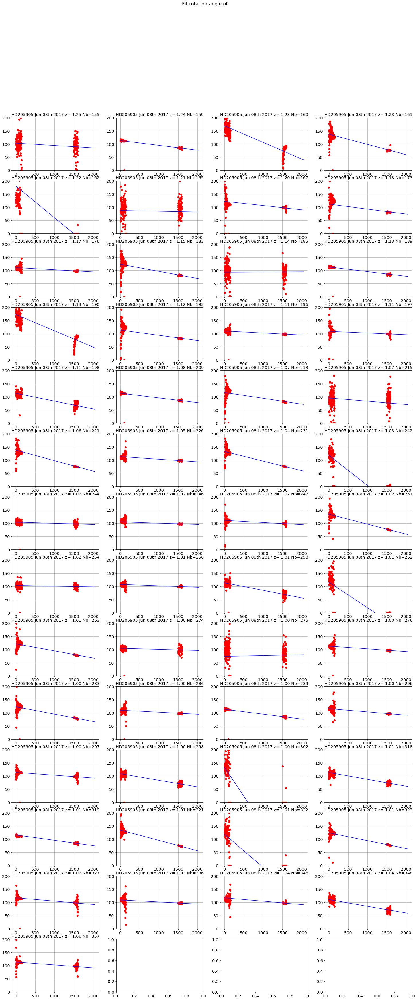

In [81]:
all_a,all_b=ComputeRotationAngle(all_images2,thex0,they0,all_titles,object_name)

In [82]:
all_angles=np.arctan(all_a)*180./np.pi

In [83]:
def ComputeRotationAngleHessian(all_images,thex0,they0,all_titles,object_name):
    """
    ComputeRotationAngle
    ====================
    
    input:
    ------
    all_images
    thex0
    they0
    all_titles
    object_name
    
    output:
    ------
    rotation angles
    
    """
    NBIMAGES=len(all_images)
    NBIMGPERROW=2
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    
    
    param_theta=np.zeros(NBIMAGES)
    
    ####### PARAMETERS TO BE TUNED #########
    lambda_threshold = -20
    deg_threshold = 8
    width_cut = 100
    ########################################

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,2*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        
        image=all_images[index]    
        
        image_sel=np.copy(image)
        y0=they0[index]
        x0=thex0[index]
        
        # extract a region of 200 x 1000 centered at y=100,x=500
        
        region=np.copy(image_sel[y0-width_cut:y0+width_cut,:])
        data=np.copy(region)
        
        # compute hessian matrices on the image
        
        Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
        lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
        lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
                

        mask = np.where(lambda_minus>lambda_threshold)
        #lambda_mask = np.copy(lambda_minus)
        #lambda_mask[mask]=np.nan

        theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi
        theta_mask = np.copy(theta)
        theta_mask[mask]=np.nan

        mask2 = np.where(np.abs(theta)>deg_threshold)
        theta_mask[mask2] = np.nan
        
        theta_hist = []
        theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
        theta_median = np.median(theta_hist)
        
        param_theta[index] = theta_median
        
        x_new = np.linspace(xindex.min(),xindex.max(), 50)
        y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
    
        im=axarr[iy,ix].imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
        im=axarr[iy,ix].plot(x_new,y_new,'b-')
        axarr[iy,ix].set_title(all_titles[index])
        
        axarr[iy,ix].set_ylim(0,2*width_cut)
        axarr[iy,ix].grid(True)
        

    title='Fit rotation angle of '.format(object_name)    
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
    plt.savefig(figfilename)  
    
    
    return param_theta
    

[ -0.51767317  -1.04938501  -3.61607491  -2.23277735  -6.86359845
  -0.16865867  -0.91388243  -1.07082523  -0.47160604  -1.55349841
   0.04027368  -1.02512098  -3.54148401  -1.13095133  -0.43839427
  -0.36820098  -1.68709546  -1.02280337  -1.25632481  -0.70410971
  -2.26802736  -0.55537079  -2.07604224  -6.59723372  -0.26455989
  -0.28714418  -0.47538217  -2.1770038   -0.16545982  -0.31806375
  -1.64313914  -5.57949113  -1.53115526  -0.24181824   0.17933685
  -0.60122531  -1.60162574  -0.43893378  -1.0675671   -0.70672451
  -0.61849813  -1.43776629 -12.28473328  -1.5009413   -1.16508431
  -2.23963563  -7.16373758  -1.70554811  -0.71357768  -0.4329349
  -0.72181922  -1.45535849  -0.63053611]
0  theta =  -0.259314021766 	x0 =  811.0 	y0 =  637.0
1  theta =  -1.0180293593 	x0 =  813.0 	y0 =  635.0
2  theta =  -2.06108676755 	x0 =  902.0 	y0 =  574.0
3  theta =  -1.86662673121 	x0 =  903.0 	y0 =  575.0
4  theta =  -1.39815291676 	x0 =  903.0 	y0 =  574.0
5  theta =  -0.312808477094 	x0 =  

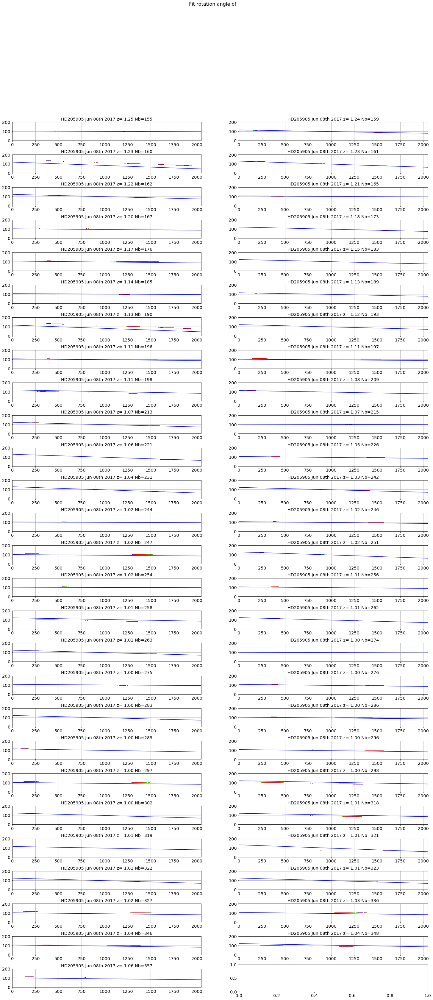

In [84]:
textfilename = os.path.join(inputdir,'star_centroids.txt')
central_positions = np.loadtxt(textfilename)

print all_angles
all_theta=ComputeRotationAngleHessian(all_images2,thex0,they0,all_titles,object_name)
for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index], '\tx0 = ',central_positions[index][1], '\ty0 = ',central_positions[index][0]

### Choose here which rotation angle to apply

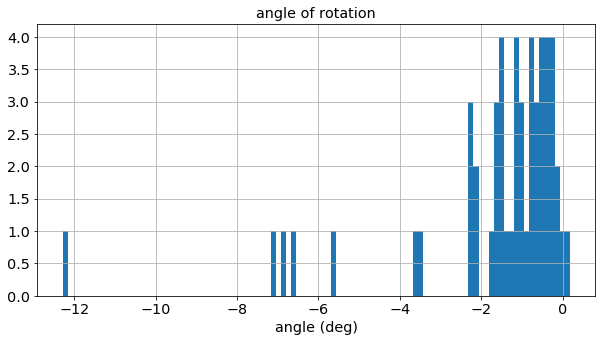

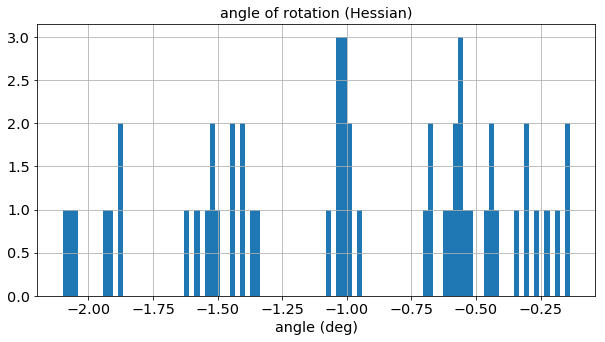

In [85]:
plt.figure(figsize=(10,5))
#hist(x, bins=10, range=None, normed=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, hold=None, data=None, **kwargs)
#n, bins, patches=plt.hist(all_angles,bins=50,range=[-1,.5],histtype='stepfilled')
n, bins, patches=plt.hist(all_angles,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation')
plt.xlabel('angle (deg)')
plt.figure(figsize=(10,5))
#hist(x, bins=10, range=None, normed=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, hold=None, data=None, **kwargs)
#n, bins, patches=plt.hist(all_angles,bins=50,range=[-1,.5],histtype='stepfilled')
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

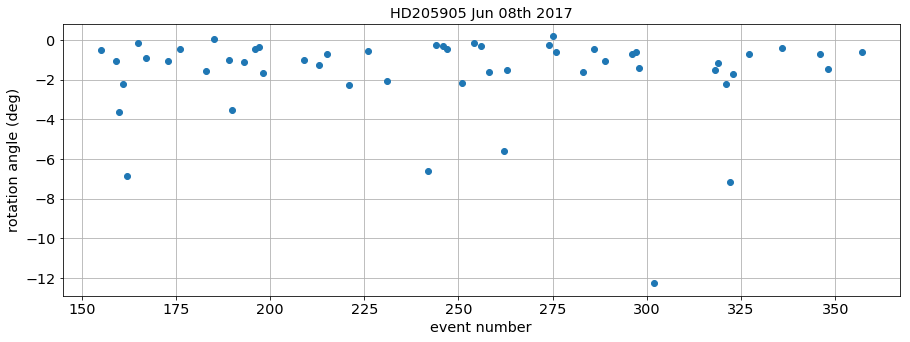

In [86]:
plt.figure(figsize=(15,5))
plt.plot(indexes_files,all_angles,'o')
plt.grid(True)
plt.ylabel('rotation angle (deg)')
plt.xlabel('event number')
plt.title(object_name)
figfilename=os.path.join(dir_top_images,'rotationvsevnum.pdf')
plt.savefig(figfilename) 

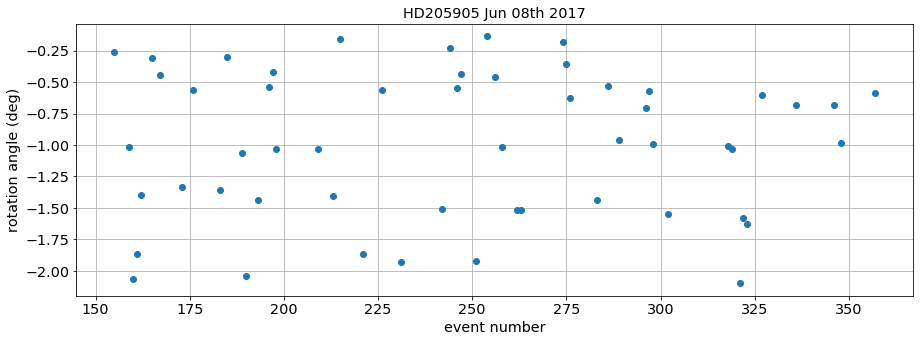

In [87]:
plt.figure(figsize=(15,5))
plt.plot(indexes_files,all_theta,'o')
plt.grid(True)
plt.ylabel('rotation angle (deg)')
plt.xlabel('event number')
plt.title(object_name)
figfilename=os.path.join(dir_top_images,'rotationvsevnum_hessian.pdf')
plt.savefig(figfilename) 

Avec la méthode Hessienne, on voit qu'on obtient des séries de 5 points : une première qui monte, une deuxième plate (donc la bonne hauteur de l'image en y ?) et trois descendantes.

## Now turn the images accordingly

In [88]:
def TurnTheImages(all_images,all_angles,all_titles,object_name,dir_top_images):
    """
    TurnTheImages
    =============
    
    input:
    ------
    all_images:
    all_angles:
    
    
    output:
    ------
    all_rotated_images
    
    """
    NBIMAGES=len(all_images)
    NBIMGPERROW=2
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    
    all_rotated_images = []

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,3*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        
        image=all_images[index]    
        angle=all_angles[index]    
        data=np.copy(image)
        
        rotated_image=ndimage.interpolation.rotate(data,angle)
        
        all_rotated_images.append(rotated_image)
        
        im=axarr[iy,ix].imshow(rotated_image,origin='lower',cmap='rainbow',vmin=0,vmax=800)
        #im=axarr[iy,ix].plot(x_new,y_new,'b-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
        
        axarr[iy,ix].grid(True)
        
    title='Rotated images for '.format(object_name)    
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
    plt.savefig(figfilename)  
    
    return all_rotated_images

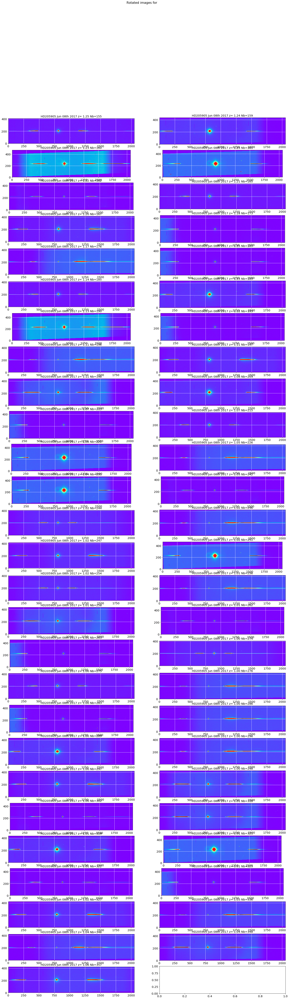

In [89]:
# J'utilise les angles qui viennent de la méthode Hessienne ici
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,dir_top_images) #same rotation for each image

## Check rotation

In case of bad rotation, check by eye

In [90]:
sel=4

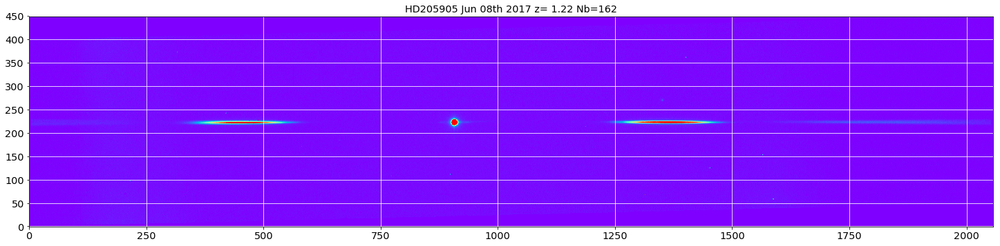

In [91]:
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

array([  6.99815321e-02,   5.34347935e-03,   3.50768897e-02,
        -5.27448314e-02,   5.69334621e-02,   1.03355015e-01,
         7.39188086e-02,   4.44737432e-02,  -5.50900062e-03,
        -1.07017348e-03,   5.54422020e-02,  -5.39549477e-03,
         1.37537288e-03,   4.16106969e-02,   3.00025374e-02,
        -1.08223261e-01,  -1.86939793e-02,   1.57719442e-02,
         5.17049009e-02,  -1.33698366e-01,  -7.30713528e-02,
         3.66268360e-02,  -8.59709314e-03,   4.46881612e-02,
        -4.09278756e-02,   8.12605083e-03,   2.11246114e-02,
         1.88422212e-02,  -1.07853425e-01,   2.20296495e-02,
         2.18425694e-02,   5.71294209e-02,   1.47724478e-01,
        -2.96806003e-02,   1.88209130e-01,   3.55680657e-02,
         9.21516897e-03,  -8.40332290e-05,  -1.09912195e-02,
         2.91355499e-02,   5.53036457e-03,   1.72502045e-03,
         1.70322952e-02,   3.30330429e-03,   3.35359402e-02,
         1.60980509e-02,   4.44665620e-02,   3.32245935e-02,
         4.04469008e-02,

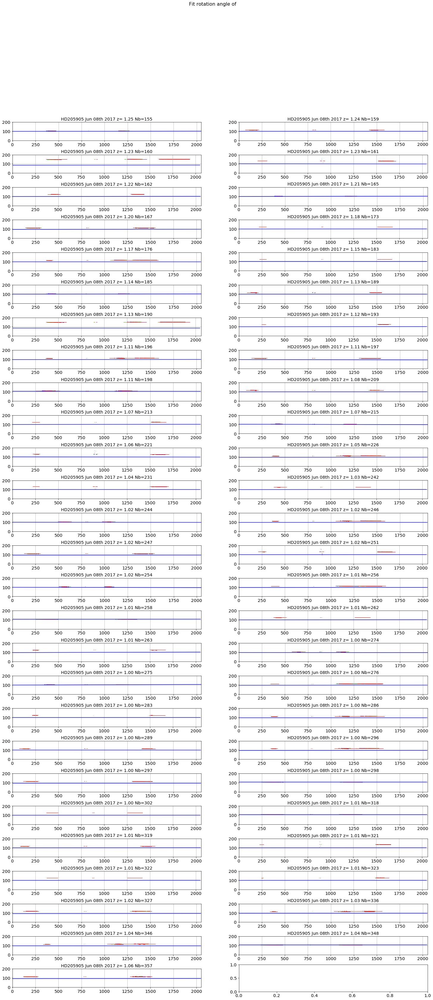

In [92]:
image_sel=np.copy(turned_images[sel])
y0=they0[sel]
x0=thex0[sel]

region=np.copy(image_sel[y0-width_cut:y0+width_cut,:])
data=np.copy(region)

ComputeRotationAngleHessian(turned_images,thex0,they0,all_titles,object_name)

In [93]:
sorted_files

array(['cut_fitsimages/cutimg_20170608_155.fits',
       'cut_fitsimages/cutimg_20170608_159.fits',
       'cut_fitsimages/cutimg_20170608_160.fits',
       'cut_fitsimages/cutimg_20170608_161.fits',
       'cut_fitsimages/cutimg_20170608_162.fits',
       'cut_fitsimages/cutimg_20170608_165.fits',
       'cut_fitsimages/cutimg_20170608_167.fits',
       'cut_fitsimages/cutimg_20170608_173.fits',
       'cut_fitsimages/cutimg_20170608_176.fits',
       'cut_fitsimages/cutimg_20170608_183.fits',
       'cut_fitsimages/cutimg_20170608_185.fits',
       'cut_fitsimages/cutimg_20170608_189.fits',
       'cut_fitsimages/cutimg_20170608_190.fits',
       'cut_fitsimages/cutimg_20170608_193.fits',
       'cut_fitsimages/cutimg_20170608_196.fits',
       'cut_fitsimages/cutimg_20170608_197.fits',
       'cut_fitsimages/cutimg_20170608_198.fits',
       'cut_fitsimages/cutimg_20170608_209.fits',
       'cut_fitsimages/cutimg_20170608_213.fits',
       'cut_fitsimages/cutimg_20170608_215.fits',


In [94]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [95]:
newfullfilenames

['./rotated_fitsimages/rotimg_20170608_155.fits',
 './rotated_fitsimages/rotimg_20170608_159.fits',
 './rotated_fitsimages/rotimg_20170608_160.fits',
 './rotated_fitsimages/rotimg_20170608_161.fits',
 './rotated_fitsimages/rotimg_20170608_162.fits',
 './rotated_fitsimages/rotimg_20170608_165.fits',
 './rotated_fitsimages/rotimg_20170608_167.fits',
 './rotated_fitsimages/rotimg_20170608_173.fits',
 './rotated_fitsimages/rotimg_20170608_176.fits',
 './rotated_fitsimages/rotimg_20170608_183.fits',
 './rotated_fitsimages/rotimg_20170608_185.fits',
 './rotated_fitsimages/rotimg_20170608_189.fits',
 './rotated_fitsimages/rotimg_20170608_190.fits',
 './rotated_fitsimages/rotimg_20170608_193.fits',
 './rotated_fitsimages/rotimg_20170608_196.fits',
 './rotated_fitsimages/rotimg_20170608_197.fits',
 './rotated_fitsimages/rotimg_20170608_198.fits',
 './rotated_fitsimages/rotimg_20170608_209.fits',
 './rotated_fitsimages/rotimg_20170608_213.fits',
 './rotated_fitsimages/rotimg_20170608_215.fits',


### Save outputfilename

In [96]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=turned_images[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,overwrite=True)

In [97]:
!ls -l rotated_fitsimages

total 742120
-rw-r--r--  1 dagoret-campagnesylvie  staff  6721920 Jul  4 16:17 rotimg_20170608_155.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  7179840 Jul  4 16:17 rotimg_20170608_159.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  7810560 Jul  4 16:17 rotimg_20170608_160.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  7692480 Jul  4 16:17 rotimg_20170608_161.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  7418880 Jul  4 16:17 rotimg_20170608_162.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  6753600 Jul  4 16:17 rotimg_20170608_165.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  6840000 Jul  4 16:17 rotimg_20170608_167.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  7384320 Jul  4 16:17 rotimg_20170608_173.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  6906240 Jul  4 16:17 rotimg_20170608_176.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  7384320 Jul  4 16:17 rotimg_20170608_183.fits
-rw-r--r--  1 dagoret-campagnesylvie  staff  6753600 Jul  4 16:17 rotimg_2017